In [1]:
from bunkatech.topic_modeling import topic_modeling
import pandas as pd
from sklearn.datasets import fetch_20newsgroups
import bamboolib

docs = fetch_20newsgroups(subset="all", remove=("headers", "footers", "quotes"))["data"]
df = pd.DataFrame(docs)
sample_size = 3000
df = df.sample(sample_size).reset_index(drop=True)
df.columns = ["text"]
df["bindex"] = df.index

In [2]:
model = topic_modeling()
bunka = model.fit(
    df,
    index_var="bindex",
    text_var="text",
    sample_size=3000,
    max_terms=1000,
    topic_number=15,
    top_terms=3,
    ngrams=(2, 2),
    ents=False,
    sample_terms=1000,
    model="tfidf",
    language="en",
)

Create Embeddings & Umap...
Embeddings..
Reducing the vectors..
UMAP(angular_rp_forest=True, metric='cosine', n_components=5, n_neighbors=10, verbose=True)
Sat Feb 26 18:29:52 2022 Construct fuzzy simplicial set
Sat Feb 26 18:29:52 2022 Finding Nearest Neighbors
Sat Feb 26 18:29:54 2022 Finished Nearest Neighbor Search
Sat Feb 26 18:29:56 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sat Feb 26 18:30:00 2022 Finished embedding
Create Clusters...


Extract Terms: 100%|████████████████████████████████████████| 1000/1000 [00:36<00:00, 27.07it/s]


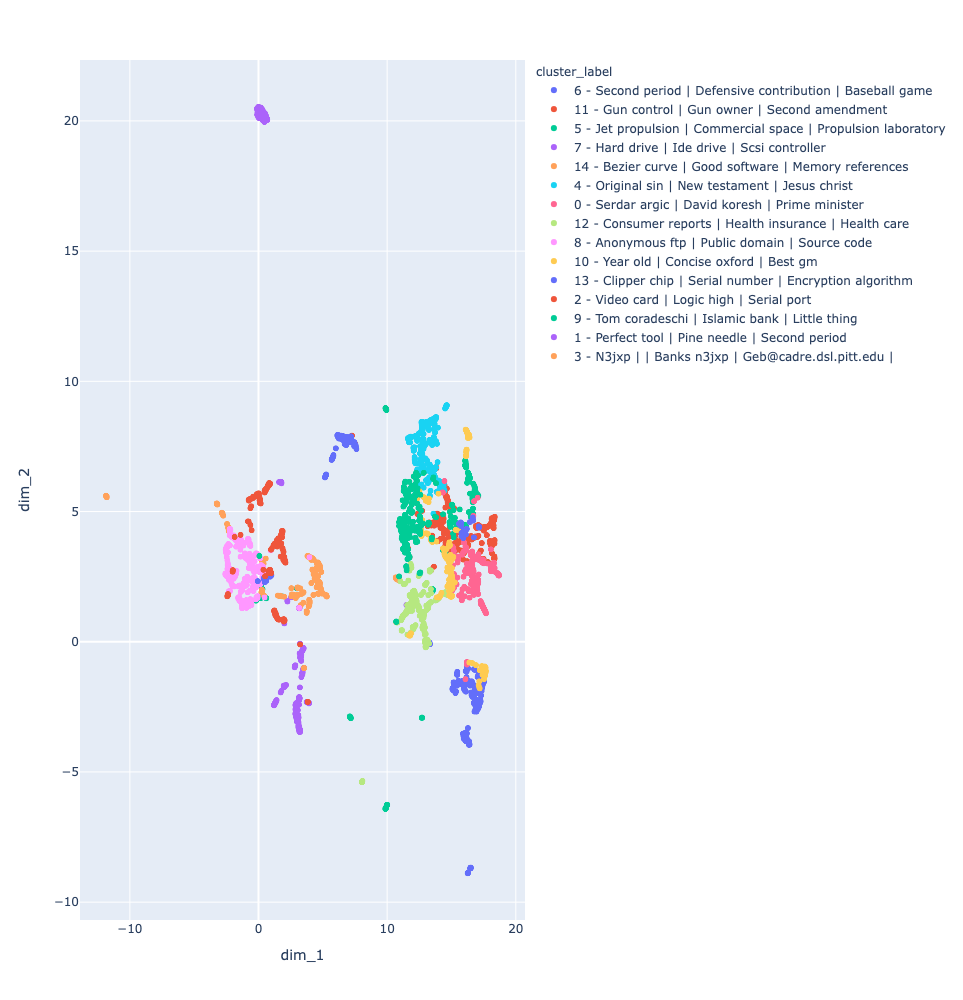

In [3]:
fig = model.visualize_embeddings(width = 1000, height = 1000)
fig.show()

In [4]:
topics = bunka.topics
topics

,cluster,cluster_name,topic_size
0,8,Anonymous ftp | Public domain | Source code,320
1,9,Tom coradeschi | Islamic bank | Little thing,291
2,11,Gun control | Gun owner | Second amendment,259
3,4,Original sin | New testament | Jesus christ,259
4,0,Serdar argic | David koresh | Prime minister,256
5,6,Second period | Defensive contribution | Baseb...,222
6,2,Video card | Logic high | Serial port,212
7,12,Consumer reports | Health insurance | Health care,200
8,14,Bezier curve | Good software | Memory references,197
9,7,Hard drive | Ide drive | Scsi controller,194


In [4]:
# With index
bunka.df_topics_names = df_topics_names
bunka.df_embeddings = df_emb
bunka.df_indexed = data